# UE Computer Vision | Lab Session 1 - Introduction to computer vision

pierre-henri.conze@imt-atlantique.fr, valerie.burdin@imt-atlantique.fr


***
This lab session is an introduction to **image processing** and **computer vision**.

We will see how to manipulate images in Python, using two libraries: `scikit-image` (http://scikit-image.org) and `openCV` (https://docs.opencv.org/3.0-beta/index.html).

In particular, four topics will be studied and discussed :
1. reading/writing images
2. image pre-processing
3. introduction to geometric transformations
4. application to image mosaicing

Beforehand, let us import the data provided (`imta.jpg`, `pano0.jpg`, `pano1.jpg`, `pano2.jpg`) into the **Colab** session !

## I - Reading/writing images

First of all, let's go to the `skimage.data_dir` directory to play with some sample images.

In [1]:
import skimage
import os
os.chdir(skimage.data_dir)
print('The folder', skimage.data_dir, 'contains sample images')

The folder /Users/jules/miniconda3/lib/python3.11/site-packages/skimage/data contains sample images


You can open an image file (`jpg`, `png`, `tiff`...) as a `numpy` array with the `skimage.io.imread()` function. Images can also be read using the `cv2.imread()` function from `openCV`. The image must be in the working directory unless a full path to the image must be given as an argument.

The second argument of the `cv2.imread()` function is a flag that specifies how the image should be read:
* `cv2.IMREAD_COLOR`: loads a color image (default flag).
* `cv2.IMREAD_GRAYSCALE`: loads the image in grayscale.
* `cv2.IMREAD_UNCHANGED`: loads the image itself, including the alpha channel.

Note that instead of these flags, you can simply pass the integers 1, 0 or -1 respectively.

In [2]:
from skimage import io
import cv2

moon        = io.imread('moon.png')
moon_cv     = cv2.imread('moon.png', cv2.IMREAD_GRAYSCALE)
astronaut   = io.imread('astronaut.png')
astronaut_2 = io.imread('astronaut.png', as_gray=True)
astronaut_3 = skimage.img_as_ubyte(io.imread('astronaut.png', as_gray=True))

Let us display these images using the `plt.imshow()` function.

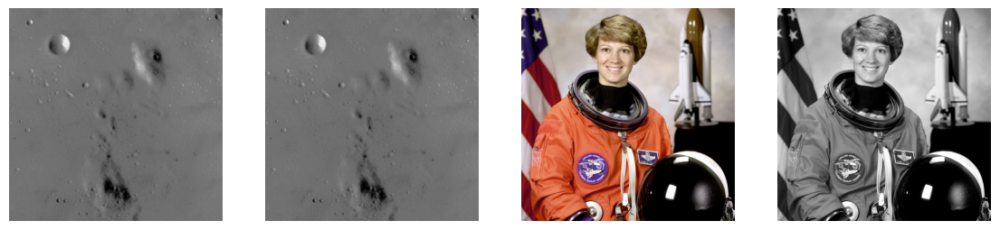

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
plt.subplot(141)
plt.imshow(moon, cmap='gray')
plt.axis('off')
plt.subplot(142)
plt.imshow(moon_cv, cmap='gray')
plt.axis('off')
plt.subplot(143)
plt.imshow(astronaut)
plt.axis('off')
plt.subplot(144)
plt.imshow(astronaut_2, cmap='gray')
plt.axis('off')
plt.show()

**Question 1 -** Print the size, type, min and max values for each of the images read above.

In [4]:
import numpy as np

print('moon:', moon.shape, moon.dtype, np.min(moon), np.max(moon))

moon: (512, 512) uint8 0 255


Image arrays are usually either **integer** arrays or **floating** point arrays. Most image formats store pixel values as integers. The most classic format corresponds to 8-bit integers (between 0 and 255) which corresponds to the `np.uint8` `numpy` type (8-bit unsigned integer).

However, it is natural to use floats when performing operations on pixels in real space, such as multiplications or divisions by real numbers. Some `scikit-image` functions for example return an array of a different type than the input array.

The functions `skimage.img_as_float()` and `skimage.img_as_ubyte()` allow **conversion between types** without worrying about scaling.

Displaying images can be done with `io.imshow()` as well as `plt.imshow()`.

**Question 2 -** Save the `numpy` array corresponding to the moon image as an image file using `io.imsave()` from `scikit-image` and `cv2.imwrite()` from `openCV`.

In [5]:
io.imsave('moon_ubyte.png', moon)
cv2.imwrite('moon_ubyte_cv.png', moon)

True

## II - Image pre-processing

A common pre-processing technique is **histogram equalization** which aims at spreading out the most frequent intensity values in low contrast images. Although it has the advantage that it does not require any parameters, it sometimes produces unnatural-looking images.

Another method is **contrast stretching** where the histogram is modified to include all intensities in the 2nd and 98th percentiles, for example.

In [6]:
from skimage import exposure

# equalization
moon_eq = exposure.equalize_hist(moon)

# contrast stretching
p2, p98 = np.percentile(moon, (2, 98))
moon_rescale = exposure.rescale_intensity(moon, in_range=(p2, p98))

In [7]:
from skimage import img_as_float

def plot_img_and_hist(image, axes, bins=256):

    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

**Question 3 -** Analyze and execute the code below. Comment on the resulting figures. Which is the model followed by the cumulative distribution function after histogram equalization?

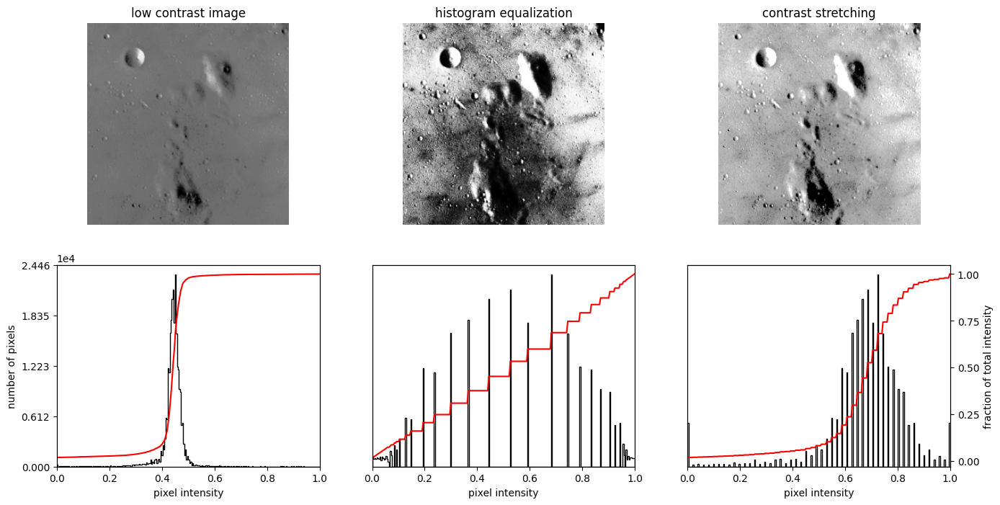

In [8]:
# display results
fig = plt.figure(figsize=(16, 8))
axes = np.zeros((2, 4), dtype=object)
axes[0, 0] = fig.add_subplot(2, 3, 1)
for i in range(1, 3):
    axes[0, i] = fig.add_subplot(2, 3, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 3):
    axes[1, i] = fig.add_subplot(2, 3, 4+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(moon, axes[:, 0])
ax_img.set_title('low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(moon_eq, axes[:, 1])
ax_img.set_title('histogram equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(moon_rescale, axes[:, 2])
ax_img.set_title('contrast stretching')

ax_cdf.set_ylabel('fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

plt.show()

> **Answer:** The cumulative distribution function (CDF) of the image after histogram equalization follows a linear model.

Let us add some noise to the astronaut image.

In [9]:
import numpy as np

astronaut = skimage.img_as_float(astronaut)
noisy = astronaut + 0.4 * np.random.random(astronaut.shape)
noisy = np.clip(noisy, 0, 1)

It is sometimes necessary to use image **filtering** or **denoising** methods before considering any processing.

`OpenCV` provides a `cv2.filter2D(img,depth,kernel)` function to convolve the image with a kernel to be defined beforehand. `depth` corresponds to the depth of the output image (if negative, it will be the same as `img`)

**Question 4 -** Apply a `5x5` averaging filter to the noisy image of the astronaut.

In [10]:
kernel = np.full((5, 5), 1/25)
denoise_moy = cv2.filter2D(noisy, -1, kernel)

The denoising can also be carried out by **bilateral** or **non-local means** filtering.

**Question 5 -** Perform both types of filtering using the `denoise_bilateral()` and `denoise_nl_means()` functions from `skimage.restoration` ([click here](http://scikit-image.org/docs/dev/api/skimage.restoration.html)). Describe each of these filtering techniques. Display and compare the results visually.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


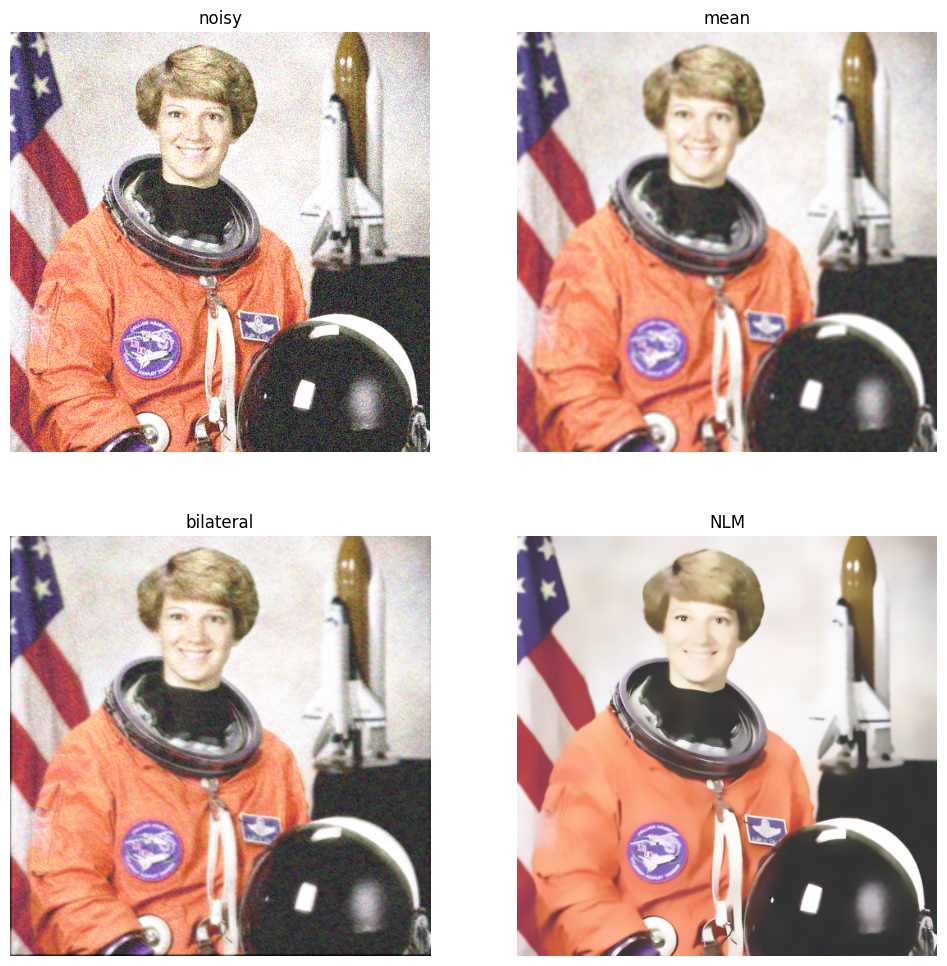

In [11]:
from skimage.restoration import denoise_bilateral, denoise_nl_means

denoise_nlm = denoise_nl_means(noisy, channel_axis=-1)
denoise_bil = denoise_bilateral(noisy, channel_axis=-1)

plt.figure(figsize=(12, 12))
plt.subplot(2,2,1),plt.imshow(noisy,cmap = 'gray')
plt.title('noisy'), plt.xticks([]), plt.yticks([])
plt.axis('off')
plt.subplot(2,2,2),plt.imshow(denoise_moy,cmap = 'gray')
plt.title('mean'), plt.xticks([]), plt.yticks([])
plt.axis('off')
plt.subplot(2,2,3),plt.imshow(denoise_bil,cmap = 'gray')
plt.title('bilateral'), plt.xticks([]), plt.yticks([])
plt.axis('off')
plt.subplot(2,2,4),plt.imshow(denoise_nlm,cmap = 'gray')
plt.title('NLM'), plt.xticks([]), plt.yticks([])
plt.axis('off')
plt.show()

> **Answer:** The mean filter tend blur the image to munch. Whereas, the biletaeral filter is more efficient to keep the edges of the image. The non-local means filter is also efficient to keep the edges of the image and to remove the noise but it seems that the image is to much smoothed.

**Question 6 -** Compute and display the images corresponding to the **horizontal** and **vertical gradients** of the astronaut image (in grayscale) using the functions `sobel_h` and `sobel_v` from `skimage.filters`. [Have a look here](http://scikit-image.org/docs/dev/api/skimage.filters.html) ! These operations can be also performed using `cv.Sobel()`. [Have a look there](https://docs.opencv.org/3.0-beta/modules/imgproc/doc/filtering.html#sobel) !

In [12]:
from skimage import filters

sobelx_cv = cv2.Sobel(astronaut_3,cv2.CV_64F,0,1,ksize=5) # order of derivatives in x and y to be indicated !
sobely_cv = cv2.Sobel(astronaut_3,cv2.CV_64F,1,0,ksize=5)
sobelx_sk = filters.sobel(astronaut_3, axis=0)
sobely_sk = filters.sobel(astronaut_3, axis=1)

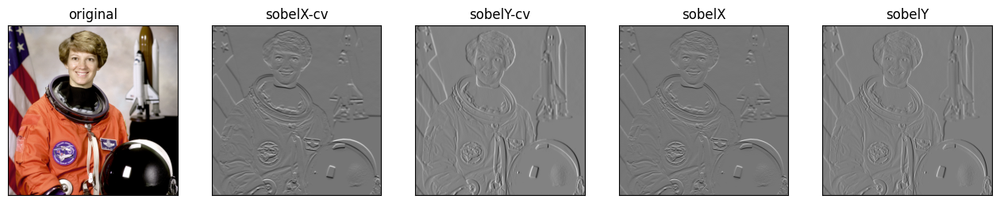

In [13]:
plt.figure(figsize=(16, 16))
plt.subplot(1,5,1),plt.imshow(astronaut, cmap = 'gray')
plt.title('original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,5,2),plt.imshow(sobelx_cv,cmap = 'gray')
plt.title('sobelX-cv'), plt.xticks([]), plt.yticks([])
plt.subplot(1,5,3),plt.imshow(sobely_cv,cmap = 'gray')
plt.title('sobelY-cv'), plt.xticks([]), plt.yticks([])
plt.subplot(1,5,4),plt.imshow(sobelx_sk,cmap = 'gray')
plt.title('sobelX'), plt.xticks([]), plt.yticks([])
plt.subplot(1,5,5),plt.imshow(sobely_sk,cmap = 'gray')
plt.title('sobelY'), plt.xticks([]), plt.yticks([])
plt.show()

## III - Introduction to geometric transformations

Several types of **parametric geometric transformations** can be considered in computer vision: rigid, similarity, affine or projective.

A rigid transformation is composed of a translation and a rotation allowing to reposition a supposedly rigid object. A similarity is a transformation that includes an isotropic scale factor in addition to both translation and rotation. An affine transformation allows, in addition to rotation and translation, an anisotropic scale factor and shear modeling. A projective transformation is mainly used to take into account perspective effects in the image.

Let us execute the code below.

[[ 1.01490425  0.09783675  0.        ]
 [-0.10183008  0.97510408  0.        ]
 [ 0.          0.          1.        ]]
[[ 1.01490425  0.09783675  0.        ]
 [-0.10183008  0.97510408 80.        ]
 [ 0.          0.          1.        ]]


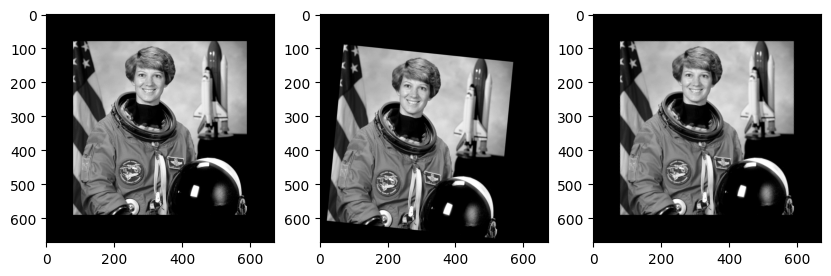

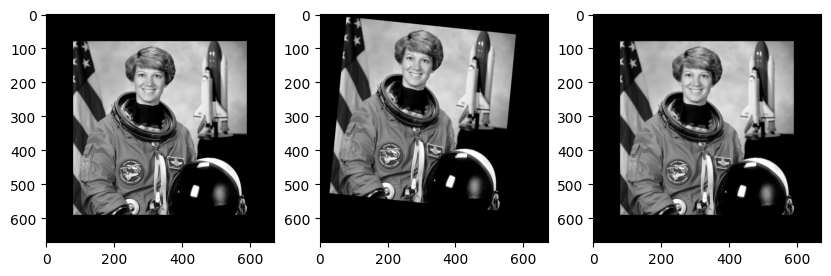

In [14]:
from skimage.transform import AffineTransform, warp
from skimage import util

astronaut = np.pad(astronaut_3, 80, 'constant')

# ----
tform = AffineTransform(scale=(1.02,0.98), rotation=-0.1)
print(tform.params)

rotated = warp(astronaut, tform) # forward
back_rotated = warp(rotated, tform.inverse) # inverse

f, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(10, 5))
ax1.imshow(astronaut, cmap=plt.cm.gray)
ax2.imshow(rotated, cmap=plt.cm.gray)
ax3.imshow(back_rotated, cmap=plt.cm.gray)
# ----

# ----
matrix = tform.params
matrix[1, 2] = 80
print(matrix)
tform = AffineTransform(matrix)

rotated = warp(astronaut, tform)
back_rotated = warp(rotated, tform.inverse)

f, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(10, 5))
ax1.imshow(astronaut, cmap=plt.cm.gray)
ax2.imshow(rotated, cmap=plt.cm.gray)
ax3.imshow(back_rotated, cmap=plt.cm.gray)
# ----

plt.show()

**How can geometric transformations be generated ?** Geometrical transformations can be created using explicit parameters (translation, rotation, scaling, shear...) or the transformation matrix directly. In the above code, we note that the affine transformation is used in direct and inverse mode between the coordinate systems of both source and destination images.

Similarly, openCV provides two transformation functions: `cv2.warpAffine()` and `cv2.warpPerspective()` with which all kinds of parametric transformations can be performed. `cv2.warpAffine()` takes a `2x3` transformation matrix as input, while `cv2.warpPerspective()` takes a `3x3` transformation matrix.

In addition to the basic features mentioned above, it is possible to estimate the parameters of a geometric transformation using the **least squares** method when we have a set of matched points in two images.

Suppose we want to extract a logo from a picture that was not acquired from the front but with a certain angle. In the simplest case of a flat surface, the content of the logo is deformed projectively. One can therefore try to apply a distortion to the area of the image corresponding to the logo in order to remove the distortion.

**Question 7 -** Carry out the extraction and deformation (towards the image plane) of the IMT Atlantique logo from the `imta.jpg` image provided by completing the code below.

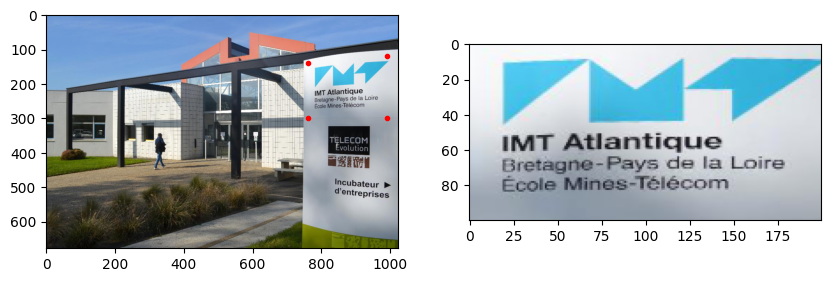

In [94]:
from skimage.transform import ProjectiveTransform

imt_img =  io.imread('/Users/jules/Downloads/lab-session-1-notebook-student/imta.jpg')
                     
coord0 = np.array([[0, 0], [0, 100], [200, 100], [200, 0]])
coord1 = np.array([[760, 140], [760, 300], [990, 300], [990, 120]])

tform = ProjectiveTransform()
tform.estimate(coord0, coord1)
warped = warp(imt_img, tform, output_shape=(100, 200))

fig, ax = plt.subplots(ncols=2, figsize=(10, 10))

ax[0].imshow(imt_img, cmap=plt.cm.gray)
ax[0].plot(coord1[:, 0], coord1[:, 1], '.r')
ax[1].imshow(warped, cmap=plt.cm.gray)

plt.show()

## IV - Application to image mosaicing

You have three images (`pano0.jpg`, `pano1.jpg`, `pano2.jpg`) of the same landscape but acquired from different viewpoints. The objective is to combine the content of these three images into a single **panoramic image**. We will exploit for this purpose the estimation of geometrical transformations through the matching of feature points extracted in each of the three images.

Let us read and display these 3 images.

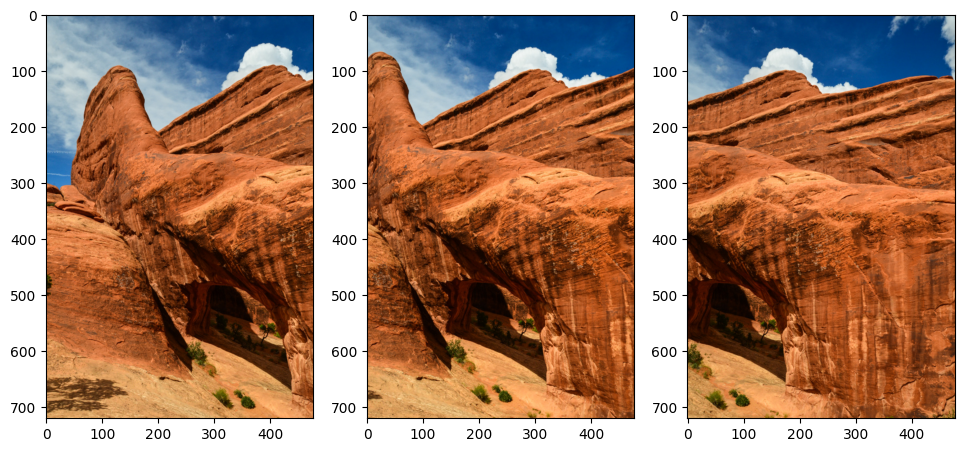

In [32]:
pano0 = io.imread('/Users/jules/Downloads/lab-session-1-notebook-student/pano0.jpg')
pano1 = io.imread('/Users/jules/Downloads/lab-session-1-notebook-student/pano1.jpg')
pano2 = io.imread('/Users/jules/Downloads/lab-session-1-notebook-student/pano2.jpg')

plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate([pano0,pano1,pano2]):
    plt.subplot(1,columns,i+1)
    plt.imshow(image)
plt.show()

The **ORB feature points** are an effective alternative to SIFT or SURF, particularly in terms of computation cost and performance. Moreover, ORB is not subject to the limitations encountered with SIFT and SURF which are patented.

For more information, [look at this link](https://medium.com/data-breach/introduction-to-orb-oriented-fast-and-rotated-brief-4220e8ec40cf) !

**Question 8 -** Complete the code below for the detection of OBR feature points in pano0, pano1 and pano2 images.

In [33]:
from skimage.feature import ORB
from skimage.color import rgb2gray

# ORB detector initialization
orb = ORB(n_keypoints=800, fast_threshold=0.05)
# 800 interest points are enough to obtain good results without unnecessarily increasing computational complexity

orb.detect_and_extract(rgb2gray(pano0))
keypoints0 = orb.keypoints
descriptors0 = orb.descriptors

orb.detect_and_extract(rgb2gray(pano1))
keypoints1 = orb.keypoints
descriptors1 = orb.descriptors

orb.detect_and_extract(rgb2gray(pano2))
keypoints2 = orb.keypoints
descriptors2 = orb.descriptors

**Question 9 -** Match the ORB features points for `pano0`/`pano1` and `pano1`/`pano2` image pairs using the `match_descriptors()` function from `skimage.feature` ([see the link](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.match_descriptors)).

In [34]:
from skimage.feature import match_descriptors

matches01 = match_descriptors(descriptors0, descriptors1, cross_check=True)
matches21 = match_descriptors(descriptors2, descriptors1, cross_check=True)

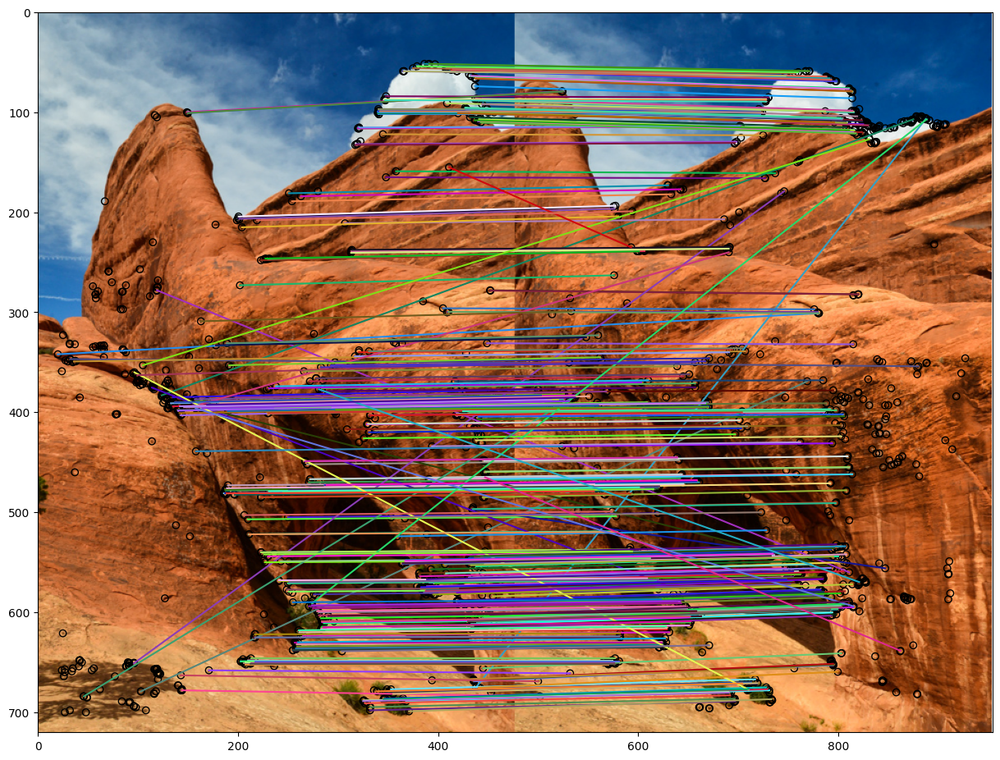

In [35]:
from skimage.feature import plot_matches

fig, ax = plt.subplots(1, 1, figsize=(15, 12))
plot_matches(ax, pano0, pano1, keypoints0, keypoints1, matches01)
plt.show()

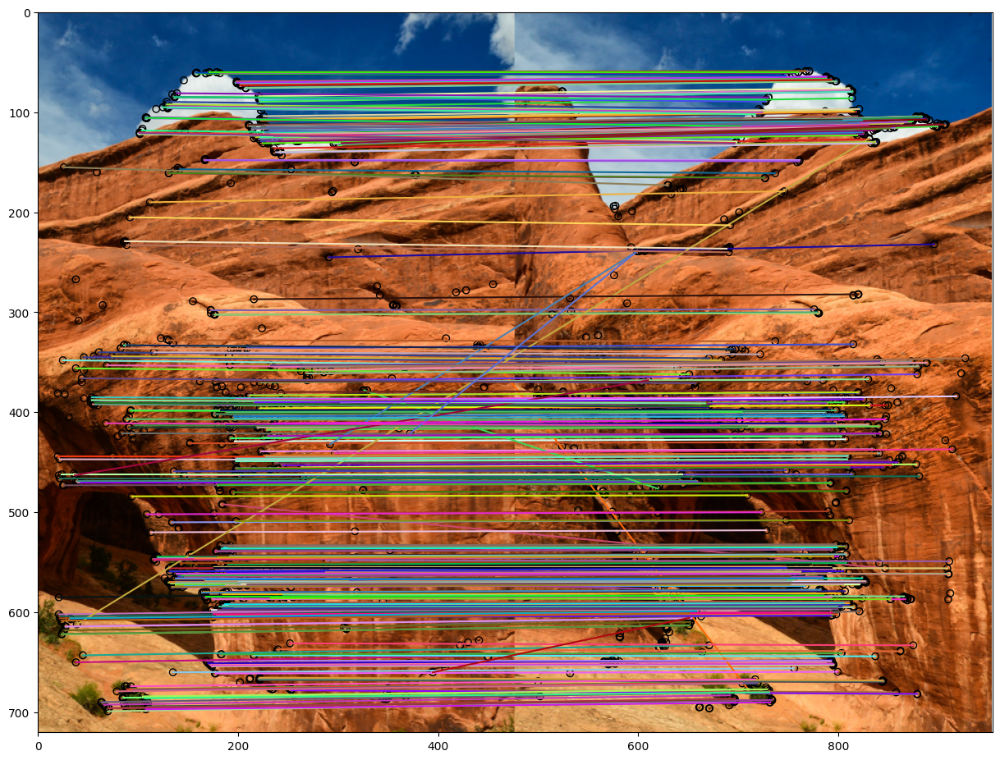

In [42]:
fix, ax = plt.subplots(1, 1, figsize=(15, 12))
plot_matches(ax, pano2, pano1, keypoints2, keypoints1, matches21)
plt.show()

**Question 10 -** Estimation of motion models for `pano0`/`pano1` and `pano2`/`pano1` image pairs using RANSAC ([RANdom SAmple Consensus](http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.ransac)). Analyze, run and comment the code below.

In [43]:
from skimage.measure import ransac

src = keypoints0[matches01[:, 0]][:, ::-1]
dst = keypoints1[matches01[:, 1]][:, ::-1]

model_robust01, inliers01 = ransac((src, dst), ProjectiveTransform,
                                   min_samples=4, residual_threshold=1, max_trials=300) # a

src = keypoints2[matches21[:, 0]][:, ::-1]
dst = keypoints1[matches21[:, 1]][:, ::-1]

model_robust21, inliers21 = ransac((src, dst), ProjectiveTransform,
                                   min_samples=4, residual_threshold=1, max_trials=300) # b

In [47]:
import numpy as np

r, c = pano1.shape[:2] # c

corners = np.array([[0, 0],
                    [0, r],
                    [c, 0],
                    [c, r]])

# d
warped_corners01 = model_robust01(corners)
warped_corners21 = model_robust21(corners)

print(warped_corners01)

all_corners = np.vstack((warped_corners01, warped_corners21, corners))

# e
corner_min = np.min(all_corners, axis=0)
corner_max = np.max(all_corners, axis=0)
output_shape = (corner_max - corner_min)

# f
output_shape = np.ceil(output_shape[::-1]).astype(int)

[[-121.90768634  -51.62548615]
 [-142.53071037  742.67460004]
 [ 373.41906559   20.53102158]
 [ 353.10016276  698.58073699]]


In [38]:
from skimage.transform import SimilarityTransform

# g
offset1 = SimilarityTransform(translation= -corner_min)

In [51]:
# h
transform01 = (model_robust01 + offset1).inverse
pano0_warped = warp(pano0, transform01, order=3,
                    output_shape=output_shape, cval=-1)

# i
pano0_mask = (pano0_warped != -1)
pano0_warped[~pano0_mask] = 0
pano0_warped = np.clip(pano0_warped, 0, 1)

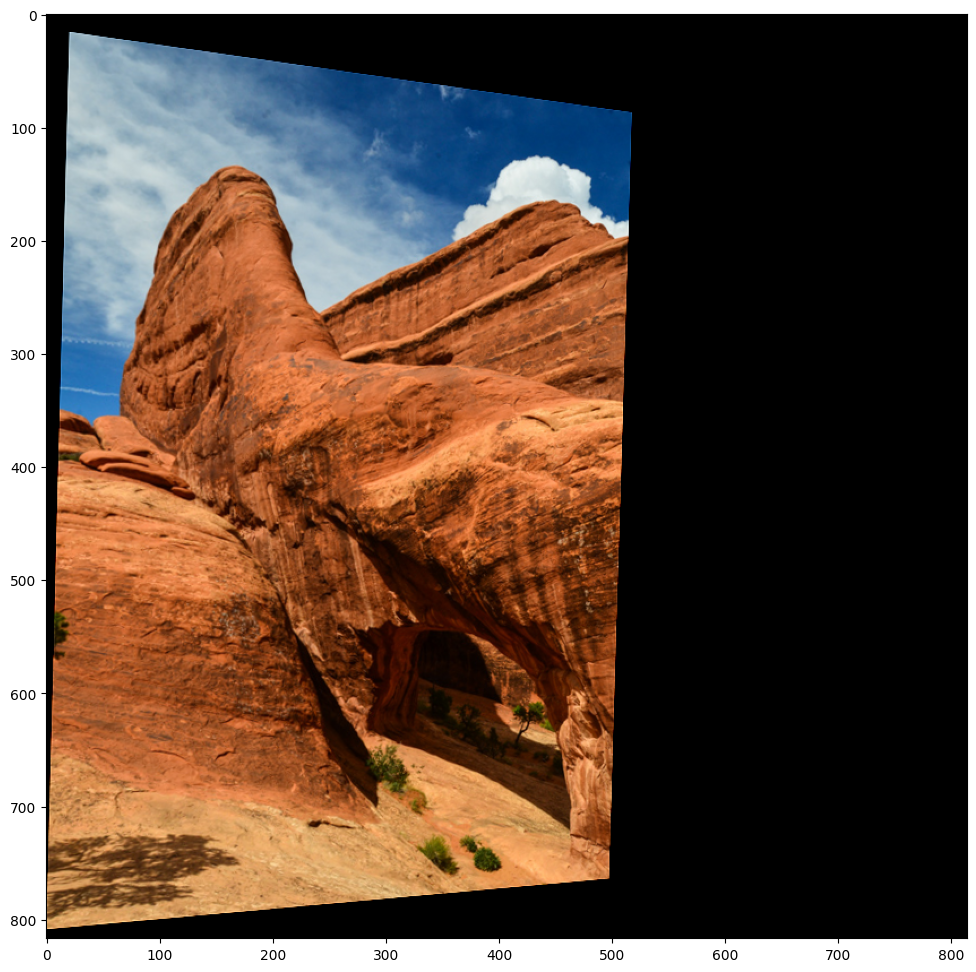

In [40]:
# plot
fig, ax = plt.subplots(1, 1, figsize=(15, 12))
ax.imshow(pano0_warped, cmap='gray')
plt.show()

> **Answers:**
>
> a - The RANSAC algorithm give a classification of the points inliers and outliers. The inliers are the points that are used to estimate the transformation model. The outliers are the points that are not used to estimate the transformation model. As well as the matrix of transformation
>
> b - As the the a- answer but we change the image pairs. In the a, the src was image0 the dst was image1. In the b, the src is image2 and the dst is image1.
>
> c - We take the shape of the image1 to then create a box with the shape of the image1
>
> d - We apply the transfomation matrix between the image1 and the image0 to the box. We obtain the box transformed. We do the same with the image2 and the image1.
>
> e - To plot the images together with the transformation, we want to define the frame of the view with the correct coordinates of the corners.
>
> f - We define the frame using the corners we have defined before
>
> g - We define the translation we want to apply to image0 in order to put it in the frame we have defined before in the correct position.
>
> h - We add the translation to the transformation matrix we have obtained before to get the final transformation matrix.
>
> i - We define the mask of the image0 in the frame we have defined before.

**Question 11 -** Perform the warping from `pano2`/`pano1` to the panoramic image based on the example provided above for `pano0`.

In [89]:
# warping of pano1 to the panoramic image
pano1_warped = warp(pano1, offset1.inverse, order=3,
                    output_shape=output_shape, cval=-1)

pano1_mask = (pano1_warped != -1)
pano1_warped[~pano1_mask] = 0
pano1_warped = np.clip(pano1_warped, 0, 1)

In [90]:
# warping from pano2 to the panoramic image
transform21 = (model_robust21 + offset1).inverse
pano2_warped = warp(pano2, transform21, order=3,
                    output_shape=output_shape, cval=-1)

pano2_mask = (pano2_warped != -1)
pano2_warped[~pano2_mask] = 0
pano2_warped = np.clip(pano2_warped, 0, 1)

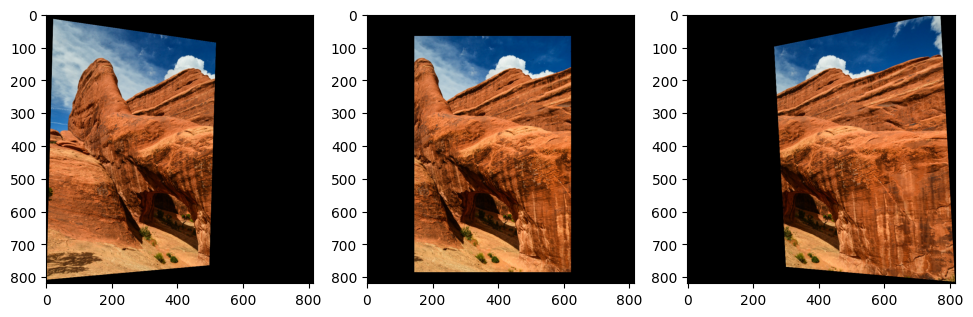

In [91]:
plt.figure(figsize=(20,10))
columns = 5
for i, image in enumerate([pano0_warped,pano1_warped,pano2_warped]):
    plt.subplot(1,columns,i+1)
    plt.imshow(image)
plt.show()

**Question 12 -**  Which processing is required to accurately put together the warping images ? Comment the code below.

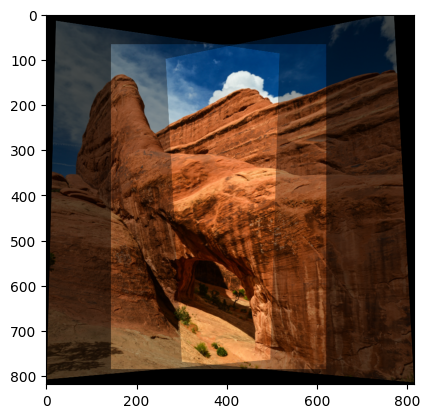

In [76]:
merged = (pano0_warped + pano1_warped + pano2_warped) # a
plt.imshow(merged/3, cmap='gray')
plt.show()

In [83]:
# b
overlap = (pano0_mask * 1. +  # c
           pano1_mask +
           pano2_mask)

# d
normalized = merged / np.maximum(overlap, 1)

> **Answers**
> 
> a - We need to blend the images together to avoid the discontinuities between the images.
>
> b - We define the overlapping area between the images using the mask we have defined before by summing the masks of the images.
>
> c - The * 1. is used to convert the mask to a float.
>
> d - Then we normalize the mask to have a value between 0 and 1. When two mask are overlapping we need to divide the mask by 2 to avoid the value to be greater than 1 and so on when we have 3 masks overlapping.

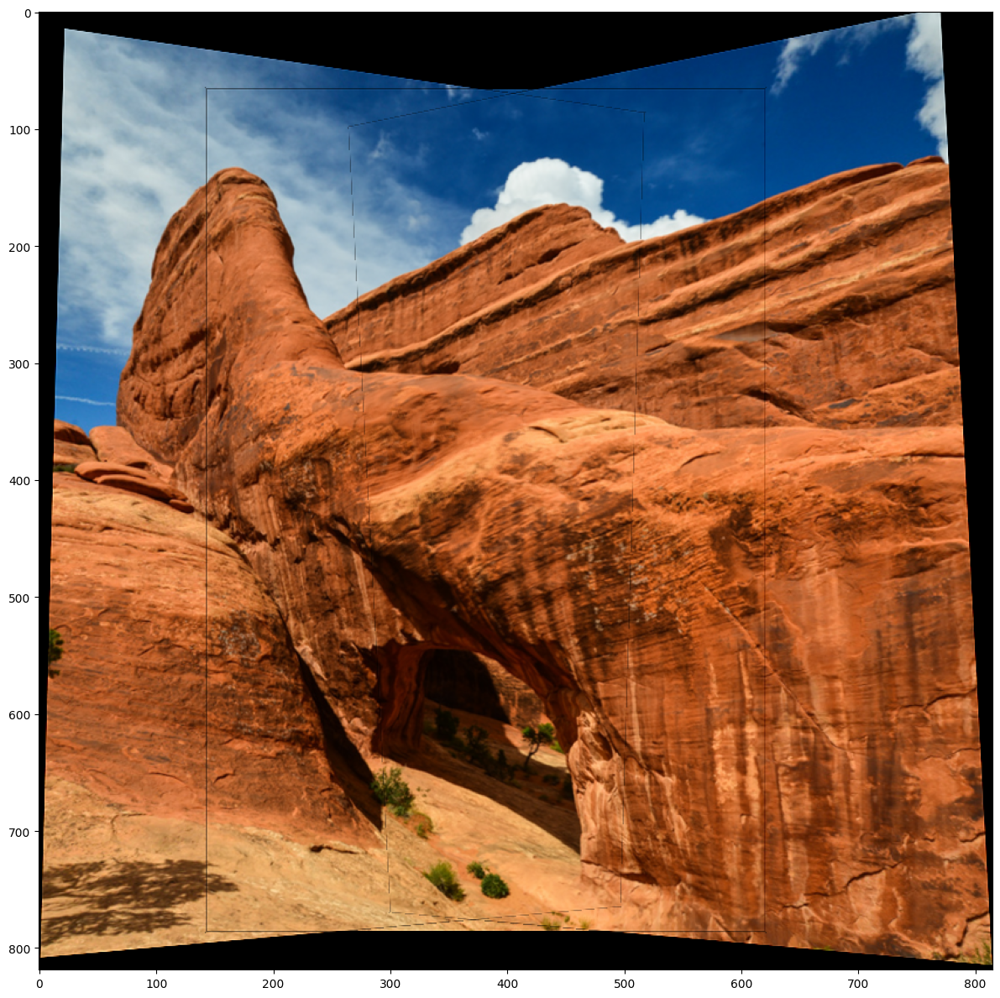

In [84]:
fig, ax = plt.subplots(figsize=(15, 12))
ax.imshow(normalized, cmap='gray')
plt.tight_layout()
plt.show()



---

